# Object Detection in Google Colab with Fizyr Retinanet

Jupyter notebook providing steps to train a Keras/Tensorflow model for object detection with custom dataset.

It runs in Google Colab using [Fizyr implementation](https://github.com/fizyr/keras-retinanet) of RetinaNet in Keras.

Requirements are only dataset images and annotations file made in [LabelImg](https://github.com/tzutalin/labelImg).

Colab Runtime type: Python3, GPU enabled.

# Environment Setup
Download and install in Colab required packages and import libraries.

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
%cd /gdrive/Shareddrives/'Departamento de Tecnología FONSIARA'/Proyectos/'[P-03] Satellite Image Detection'/retinanet/objdet_fizyr_colab-master/

/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master


In [ ]:
import os
import shutil

In [ ]:
shutil.rmtree('keras-retinanet')
!git clone https://github.com/fizyr/keras-retinanet.git

Cloning into 'keras-retinanet'...
remote: Enumerating objects: 6205, done.
remote: Total 6205 (delta 0), reused 0 (delta 0), pack-reused 6205
Receiving objects: 100% (6205/6205), 13.47 MiB | 11.23 MiB/s, done.
Resolving deltas: 100% (4200/4200), done.


In [ ]:
%cd keras-retinanet/

/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet


In [ ]:
!pip install .

Processing /gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet
  Created wheel for keras-retinanet: filename=keras_retinanet-1.0.0-cp37-cp37m-linux_x86_64.whl size=168008 sha256=518732ec4333017977fef4b27996305bf777a90720323c9f92fea7005e3608a9
  Stored in directory: /root/.cache/pip/wheels/9f/25/ae/3f441db8adc43e0d09512077d21fdd9f46d8c82f9fb3a848a2
  Created wheel for keras-resnet: filename=keras_resnet-0.2.0-py2.py3-none-any.whl size=20486 sha256=b25b7aa5a2e85544d91f8f647fa917d6b05e7b7ff77dca1fe98c7c529cf7bf00
  Stored in directory: /root/.cache/pip/wheels/5f/09/a5/497a30fd9ad9964e98a1254d1e164bcd1b8a5eda36197ecb3c
Successfully built keras-retinanet keras-resnet


In [ ]:
!python setup.py build_ext --inplace

running build_ext
cythoning keras_retinanet/utils/compute_overlap.pyx to keras_retinanet/utils/compute_overlap.c
/usr/local/lib/python3.7/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet/keras_retinanet/utils/compute_overlap.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'keras_retinanet.utils.compute_overlap' extension
creating build
creating build/temp.linux-x86_64-3.7
creating build/temp.linux-x86_64-3.7/keras_retinanet
creating build/temp.linux-x86_64-3.7/keras_retinanet/utils
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fdebug-prefix-map=/build/python3.7-a56wZI/python3.7-3.7.10=. -fstack-protector-strong -Wformat -Werror=format-security -g -fdeb

In [ ]:
import os
import shutil
import zipfile
import urllib
import xml.etree.ElementTree as ET
import numpy as np
import csv
import pandas
from google.colab import drive
from google.colab import files

# Making Dataset

Made dataset with https://app.roboflow.com/dataset/sid-images/3

In [ ]:
DATASET_DIR = '/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/dataset/train/'

In [ ]:
ANNOTATIONS_FILE = '/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet/_annotations.csv'
CLASSES_FILE = '/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/classes.csv'

In [ ]:
os.getcwd()

'/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet'

In [ ]:
import pandas as pd

In [ ]:
a_f = pd.read_csv(ANNOTATIONS_FILE,header=None)

In [ ]:
a_f.shape

(6385, 6)

In [ ]:
a_f.head()

,0,1,2,3,4,5
0,/gdrive/Shareddrives/Departamento de Tecnologi...,62,114,78,126,buildings
1,/gdrive/Shareddrives/Departamento de Tecnologi...,20,64,29,81,buildings
2,/gdrive/Shareddrives/Departamento de Tecnologi...,10,45,32,62,buildings
3,/gdrive/Shareddrives/Departamento de Tecnologi...,61,11,80,38,buildings
4,/gdrive/Shareddrives/Departamento de Tecnologi...,124,17,137,38,buildings


In [ ]:
a_f[0]='/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/dataset/train/'+a_f[0]

In [ ]:
a_f.head()

,0,1,2,3,4,5
0,/gdrive/Shareddrives/Departamento de Tecnologi...,62,114,78,126,buildings
1,/gdrive/Shareddrives/Departamento de Tecnologi...,20,64,29,81,buildings
2,/gdrive/Shareddrives/Departamento de Tecnologi...,10,45,32,62,buildings
3,/gdrive/Shareddrives/Departamento de Tecnologi...,61,11,80,38,buildings
4,/gdrive/Shareddrives/Departamento de Tecnologi...,124,17,137,38,buildings


In [ ]:
a_f[5].unique()

array(['buildings'], dtype=object)

In [ ]:
af_csv= a_f

In [ ]:
af_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6385 entries, 0 to 6384
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       6385 non-null   object
 1   1       6385 non-null   int64 
 2   2       6385 non-null   int64 
 3   3       6385 non-null   int64 
 4   4       6385 non-null   int64 
 5   5       6385 non-null   object
dtypes: int64(4), object(2)
memory usage: 299.4+ KB


In [ ]:
af_csv.to_csv(ANNOTATIONS_FILE,index=False,header=False)

# Training Model

Download pretrained model and run training.

In the next cell choose one option:

1.   download Fizyr Resnet50 pretrained model
2.   download your custom pretrained model, to continue previous training epochs

In the last cell optionally export trained model to Google Drive.


In [ ]:
import urllib.request

In [ ]:
PRETRAINED_MODEL = './snapshots/_pretrained_model.h5'

#### OPTION 1: DOWNLOAD INITIAL PRETRAINED MODEL FROM FIZYR ####
URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'

urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)

#### OPTION 2: DOWNLOAD CUSTOM PRETRAINED MODEL FROM GOOGLE DRIVE. CHANGE DRIVE_MODEL VALUE. USE THIS TO CONTINUE PREVIOUS TRAINING EPOCHS ####
#drive.mount('/content/gdrive')
#DRIVE_MODEL = '/content/gdrive/My Drive/Colab Notebooks/objdet_tensorflow_colab/resnet50_csv_10.h5'
#shutil.copy(DRIVE_MODEL, PRETRAINED_MODEL)


print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

Downloaded pretrained model to ./snapshots/_pretrained_model.h5


In [ ]:
!chmod 755 -R 'keras_retinanet/bin/train.py'

In [ ]:
ANNOTATIONS_FILE

'/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet/_annotations.csv'

In [ ]:
!pwd

/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet


In [ ]:
train_im = [a for a in 
  os.listdir('/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/dataset/train')
  if 'jpg' in a]

In [ ]:
len(train_im)

335

In [ ]:
!keras_retinanet/bin/train.py --freeze-backbone --random-transform --weights {PRETRAINED_MODEL} --batch-size 4 --steps 80 --epochs 100 csv _annotations.csv classes.csv

In [ ]:
!keras_retinanet/bin/train.py --freeze-backbone --random-transform --batch-size 4 --steps 80 --epochs 100 csv _annotations.csv classes.csv

2021-04-07 22:45:33.185716: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
102948864/102945312 [==============================] - 1s 0us/step
Creating model, this may take a second...
2021-04-07 22:45:41.156651: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-04-07 22:45:41.160763: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-04-07 22:45:41.170395: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-04-07 22:45:41.171039: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMem

In [ ]:
def load_retinanet(weights, n_classes, freeze=True):
    modifier = freeze_model if freeze else None

    model = resnet50_retinanet(num_classes=num_classes, modifier=modifier)
    model.load_weights(weights, by_name=True, skip_mismatch=True)

    return model
  
  
def compile(model):
    model.compile(
        loss={
            'regression'    : keras_retinanet.losses.smooth_l1(),
            'classification': keras_retinanet.losses.focal()
        },
        optimizer=optimizers.adam(lr=configs['lr'], clipnorm=0.001)
    )
    
    
def train(model, train_gen, val_gen, callbacks, n_epochs=20):
    """train_gen and val_gen are instances of DfGenerator."""
    model.fit_generator(
        train_gen,
        steps_per_epoch=len(train_gen),
        validation_data=val_gen,
        validation_steps=len(val_gen),
        callbacks=callbacks,
        epochs=n_epochs,
        verbose=2
    )

In [ ]:
import argparse
import os
import sys
import warnings

from tensorflow import keras
import tensorflow as tf

# Allow relative imports when being executed as script.
if __name__ == "__main__" and __package__ is None:
    sys.path.insert(0, os.path.join(os.path.dirname(__file__), '..', '..'))
    import keras_retinanet.bin  # noqa: F401
    __package__ = "keras_retinanet.bin"

# Change these to absolute imports if you copy this script outside the keras_retinanet package.
from .. import layers  # noqa: F401
from .. import losses
from .. import models
from ..callbacks import RedirectModel
from ..callbacks.eval import Evaluate
from ..models.retinanet import retinanet_bbox
from ..preprocessing.csv_generator import CSVGenerator
from ..preprocessing.kitti import KittiGenerator
from ..preprocessing.open_images import OpenImagesGenerator
from ..preprocessing.pascal_voc import PascalVocGenerator
from ..utils.anchors import make_shapes_callback
from ..utils.config import read_config_file, parse_anchor_parameters, parse_pyramid_levels
from ..utils.gpu import setup_gpu
from ..utils.image import random_visual_effect_generator
from ..utils.model import freeze as freeze_model
from ..utils.tf_version import check_tf_version
from ..utils.transform import random_transform_generator

In [ ]:
-freeze-backbone --random-transform --batch-size 4 --steps 80 --epochs 100 csv _annotations.csv classes.csv

In [ ]:
args = 

In [ ]:
common_args = {
        'batch_size'       : 4,
        'config'           : None,
        'image_min_side'   : None,
        'image_max_side'   : args.image_max_side,
        'no_resize'        : args.no_resize,
        'preprocess_image' : preprocess_image,
        'group_method'     : args.group_method
    }


In [ ]:
transform_generator = random_transform_generator(
            min_rotation=-0.1,
            max_rotation=0.1,
            min_translation=(-0.1, -0.1),
            max_translation=(0.1, 0.1),
            min_shear=-0.1,
            max_shear=0.1,
            min_scaling=(0.9, 0.9),
            max_scaling=(1.1, 1.1),
            flip_x_chance=0.5,
            flip_y_chance=0.5,
        )
visual_effect_generator = random_visual_effect_generator(
    contrast_range=(0.9, 1.1),
    brightness_range=(-.1, .1),
    hue_range=(-0.05, 0.05),
    saturation_range=(0.95, 1.05)
)

In [ ]:
train_generator = CSVGenerator(
            args.annotations,
            args.classes,
            transform_generator=transform_generator,
            visual_effect_generator=visual_effect_generator,
            **common_args
        )

In [ ]:
#### OPTIONAL: EXPORT TRAINED MODEL TO DRIVE ####
#drive.mount('/content/gdrive')
file = 'resnet50_csv_50.h5'
COLAB_MODEL = './snapshots/' + file
DRIVE_DIR = '/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/model/'+file
shutil.copy(COLAB_MODEL, DRIVE_DIR)

'/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/model/resnet50_csv_50.h5'

# Inference
Run inference with uploaded image on trained model.

In [ ]:

THRES_SCORE = 0.4

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
%cd '/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet'

/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet


In [ ]:
%cd /gdrive/Shareddrives/'Departamento de Tecnología FONSIARA'/Proyectos/'[P-03] Satellite Image Detection'/retinanet/objdet_fizyr_colab-master/

/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master


In [ ]:
import os
import shutil

In [ ]:
shutil.rmtree('keras-retinanet')

In [ ]:
!git clone https://github.com/fizyr/keras-retinanet.git

Cloning into 'keras-retinanet'...
remote: Enumerating objects: 6205, done.
remote: Total 6205 (delta 0), reused 0 (delta 0), pack-reused 6205
Receiving objects: 100% (6205/6205), 13.47 MiB | 10.71 MiB/s, done.
Resolving deltas: 100% (4200/4200), done.


In [ ]:
%cd keras-retinanet/

/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet


In [ ]:
!pip install .

Processing /gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet
  Created wheel for keras-retinanet: filename=keras_retinanet-1.0.0-cp37-cp37m-linux_x86_64.whl size=168009 sha256=44fdc9e74220528993a27445ab0de922abeed787ddc1a20ea7f4c95e197ab939
  Stored in directory: /root/.cache/pip/wheels/f9/80/79/9b3e13f2ee5cde0f94b14cf2d0607a09cd30db94c067ac6476
  Created wheel for keras-resnet: filename=keras_resnet-0.2.0-py2.py3-none-any.whl size=20486 sha256=66fa2db7f686be410a768910b2ec6c7035f058c9092cba6fd9df99d561f93ffb
  Stored in directory: /root/.cache/pip/wheels/5f/09/a5/497a30fd9ad9964e98a1254d1e164bcd1b8a5eda36197ecb3c
Successfully built keras-retinanet keras-resnet


In [ ]:
!python setup.py build_ext --inplace

running build_ext
cythoning keras_retinanet/utils/compute_overlap.pyx to keras_retinanet/utils/compute_overlap.c
/usr/local/lib/python3.7/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/keras-retinanet/keras_retinanet/utils/compute_overlap.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'keras_retinanet.utils.compute_overlap' extension
creating build
creating build/temp.linux-x86_64-3.7
creating build/temp.linux-x86_64-3.7/keras_retinanet
creating build/temp.linux-x86_64-3.7/keras_retinanet/utils
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fdebug-prefix-map=/build/python3.7-a56wZI/python3.7-3.7.10=. -fstack-protector-strong -Wformat -Werror=format-security -g -fdeb

In [ ]:
# show images inline
%matplotlib inline

# automatically reload modules when they have changed
%reload_ext autoreload
%autoreload 2

# import keras
import tensorflow.keras
import tensorflow as tf

# import keras_retinanet
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time
import pandas


# set tf backend to allow memory to grow, instead of claiming everything
import tensorflow as tf

def get_session():
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    return tf.Session(config=config)

# use this environment flag to change which GPU to use
#os.environ["CUDA_VISIBLE_DEVICES"] = "1"

# set the modified tf session as backend in keras

In [ ]:
DRIVE_DIR = '/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/model'

In [ ]:
models_path = os.listdir(DRIVE_DIR)
print(models_path)
model_path = os.path.join(DRIVE_DIR,models_path[-1])

['resnet50_csv_01.h5', 'resnet50_csv_10.h5', 'resnet50_csv_100.h5', 'resnet50_csv_30.h5', 'resnet50_csv_50.h5']


In [ ]:

CLASSES_FILE = '/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/classes.csv'
# load retinanet model
model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)

# load label to names mapping for visualization purposes
labels_to_names = pandas.read_csv(CLASSES_FILE,header=None).T.loc[0].to_dict()

In [ ]:
df_test_data = pandas.read_csv('/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/dataset/test/_annotations.csv',header=None)
df_test_data['box'] = df_test_data.apply(lambda x: (x[1],x[2],x[3],x[4]),axis=1)
df_test_data.head(2)

,0,1,2,3,4,5,box
0,1M0qyN-tffe6o7lGu7XzQBFIhvt0KeMdj_1_png.rf.2a1...,373,104,386,117,buildings,"(373, 104, 386, 117)"
1,1M0qyN-tffe6o7lGu7XzQBFIhvt0KeMdj_1_png.rf.2a1...,388,94,402,107,buildings,"(388, 94, 402, 107)"


In [ ]:
def jaccard(a, b):
    """box_X is a tuple of the shape (x1, y1, x2, y2)."""
    side1 = max(0, min(a[2], b[2]) - max(a[0], b[0]))
    side2 = max(0, min(a[3], b[3]) - max(a[1], b[1]))
    inter = side1 * side2
    
    area_a = (a[2] - a[0]) * (a[3] - a[1])
    area_b = (b[2] - b[0]) * (b[3] - b[1])
    union = area_a + area_b - inter
    
    return inter / union


def is_valid(box_pred, box_true, threshold=0.3):
    return jaccard(box_pred, box_true) >= threshold

In [ ]:
def img_inference(img_path,THRES_SCORE):
  image = read_image_bgr(img_path)
  g_box = []
  box_tp = []
  # copy to draw on
  draw = image.copy()
  draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

  # preprocess image for network
  image = preprocess_image(image)
  image, scale = resize_image(image)

  # process image
  start = time.time()
  boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))

  selected_indices = tf.image.non_max_suppression(
      tf.squeeze(boxes), tf.squeeze(scores), 200, 0.1)
  selected_boxes = tf.gather(tf.squeeze(tf.convert_to_tensor(boxes)), selected_indices).numpy()
  selected_scores = tf.gather(tf.squeeze(tf.convert_to_tensor(scores)), selected_indices).numpy()
  selected_labels = tf.gather(tf.squeeze(tf.convert_to_tensor(labels)), selected_indices).numpy()

  print("processing time: ", time.time() - start)

  # correct for image scale
  selected_boxes /= scale

  # visualize detections
  for box, score, label in zip(selected_boxes, selected_scores, selected_labels):
      # scores are sorted so we can break
      if score < THRES_SCORE:
          break

      color = label_color(label)

      b = box.astype(int)
      draw_box(draw, b, color=color,thickness=1)
      g_box.append(box)
      bool_tp = df_houss['box'].apply(lambda x: is_valid(box,x)).any()
      if bool_tp:
        box_tp.append(box)

      caption = "{} {:.3f}".format(labels_to_names[label], score)
      draw_caption(draw, b, caption)

  return draw,g_box,box_tp

In [ ]:
test_im = [a for a in 
  os.listdir('/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/dataset/test')
  if 'jpg' in a]

In [ ]:
len(test_im)

37

In [ ]:
def compute_metrics(true_pos, false_pos, false_neg):
  if (true_pos + false_neg) == 0 or false_pos+true_pos == 0:
    return 0, 0, 0
  """Compute the precision, recall, and f1 score."""
  precision = true_pos / (true_pos + false_pos)
  recall = true_pos / (true_pos + false_neg)

  if precision == 0 or recall == 0:
      return precision, recall, 0

  f1 = 2 / (1 / precision + 1 / recall)
  return precision, recall, f1

In [ ]:
tps = []
fps = []
fns = []
for im in test_im:
  df_houss =  df_test_data[df_test_data[0]==im]

  print('Running inference on: ' + im)
  im_path='/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/retinanet/objdet_fizyr_colab-master/dataset/test/'+im
  d,boxes,box_tp = img_inference(im_path,0.3)
  f, ax = plt.subplots(1,2,figsize=(40, 20))
  image = cv2.cvtColor(cv2.imread(im_path), cv2.COLOR_BGR2RGB)

  for hous in df_houss['box'].to_list():
      x1, y1, x2, y2 = hous[0],hous[1],hous[2],hous[3]
      #label = str(classes[class_ids[i]])
      label = ""
      color = (255, 0, 0)
      #cv2.rectangle(imagen, start point, end point, color, grosor de la línea)
      cv2.rectangle(image, (x1, y1), (x2, y2), color, 1)

  
  plt.axis('off')
  ax[0].imshow(d)
  ax[1].imshow(image)
  ax[0].axis('off')
  ax[1].axis('off')

  real_b = df_houss.shape[0]

  ax[0].set_title('RETINANET BUILDINGS {}'.format(len(boxes)))
  ax[1].set_title('REAL BUILDINGS {}'.format(real_b))

  true_pos = len(box_tp)
  false_pos = len(boxes)-len(box_tp)
  false_neg = real_b-len(box_tp)
  tps.append(true_pos)
  fps.append(false_pos)
  fns.append(false_neg)
  pr, acc, f1 = compute_metrics(true_pos, false_pos, false_neg)

  plt.suptitle('TP {}, FP {}\n FN {}, TN {}\n precis = {}%, acc = {}%'.format(true_pos,false_pos,false_neg,None,round(100*pr,2),round(acc*100,2)),fontsize=25)
  
  plt.show()

In [ ]:
print('RETINANET\nTP {}, FP {}\n FN {}'.format(sum(tps),sum(fps),sum(fns)))
pr, acc, f1 = compute_metrics(sum(tps),sum(fps),sum(fns))
print('precis = {}%, acc = {}%, f1 = {}%'.format(round(100*pr,2),round(acc*100,2),round(f1*100,2)))

RETINANET
TP 515, FP 85
 FN 162
precis = 85.83%, acc = 76.07%, f1 = 80.66%


In [ ]:
poc_dir = '/gdrive/Shareddrives/Departamento de Tecnología FONSIARA/Proyectos/[P-03] Satellite Image Detection/POC_images/'
poc_imgs = os.listdir(poc_dir)

In [ ]:
def img_inference2(img_path,THRES_SCORE):
  image = read_image_bgr(img_path)[0:1000,500:1500,:]
  g_box = []
  # copy to draw on
  draw = image.copy()
  draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

  # preprocess image for network
  image = preprocess_image(image)
  image, scale = resize_image(image)

  # process image
  start = time.time()
  boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))

  selected_indices = tf.image.non_max_suppression(
      tf.squeeze(boxes), tf.squeeze(scores), 200, 0.3)
  selected_boxes = tf.gather(tf.squeeze(tf.convert_to_tensor(boxes)), selected_indices).numpy()
  selected_scores = tf.gather(tf.squeeze(tf.convert_to_tensor(scores)), selected_indices).numpy()
  selected_labels = tf.gather(tf.squeeze(tf.convert_to_tensor(labels)), selected_indices).numpy()

  print("processing time: ", time.time() - start)

  # correct for image scale
  selected_boxes /= scale

  # visualize detections
  for box, score, label in zip(selected_boxes, selected_scores, selected_labels):
      # scores are sorted so we can break
      if score < THRES_SCORE:
          break

      color = label_color(label)

      b = box.astype(int)
      draw_box(draw, b, color=color,thickness=4)
      g_box.append(box)

      caption = "{} {:.3f}".format(labels_to_names[label], score)
      draw_caption(draw, b, caption)

  return draw,g_box

Running inference on: Monnon_5_19_500.png
processing time:  0.13379430770874023


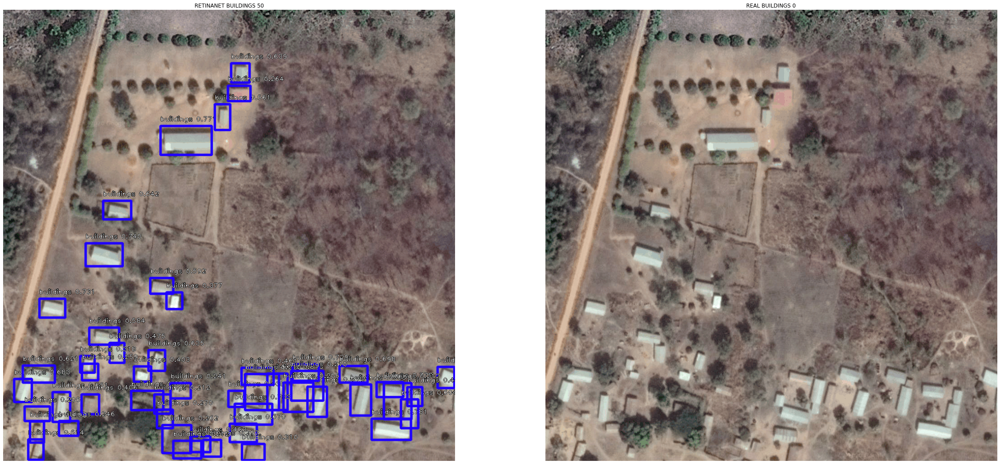

Running inference on: Sansi Gando_5_19_500.png
processing time:  0.15732669830322266


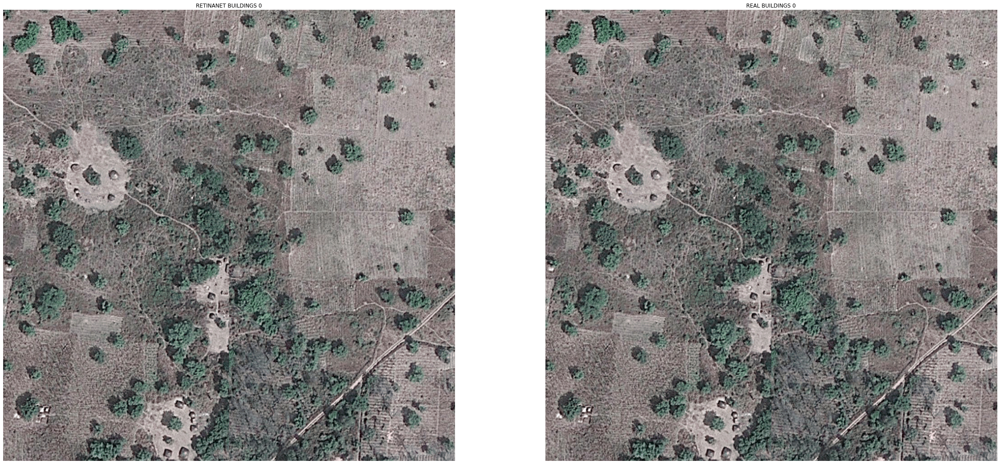

Running inference on: Besen Gourou_5_19_500.png
processing time:  0.12960600852966309


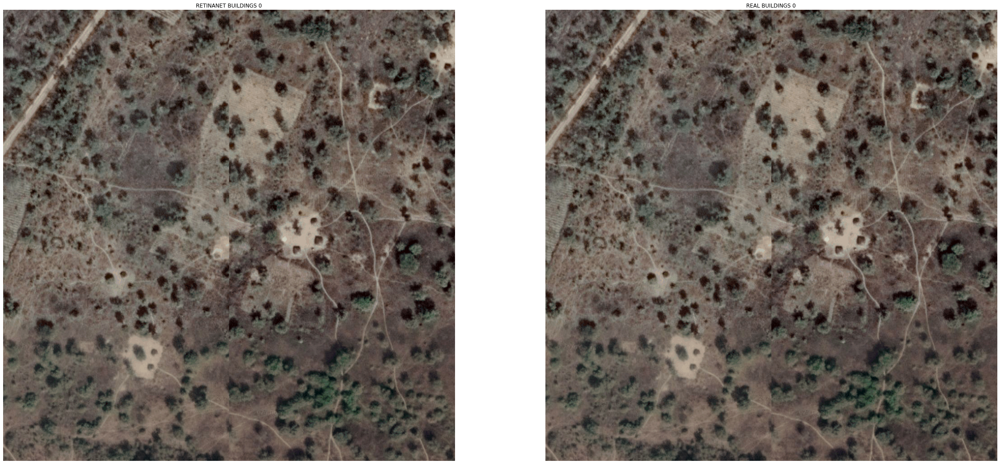

Running inference on: Barkedje_5_19_500.png
processing time:  0.13449549674987793


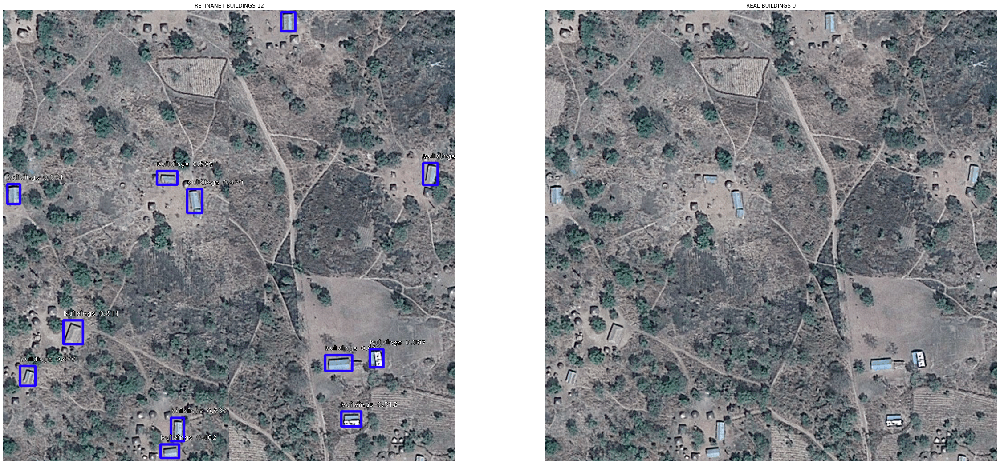

Running inference on: Boudal_5_19_500.png
processing time:  0.13622546195983887


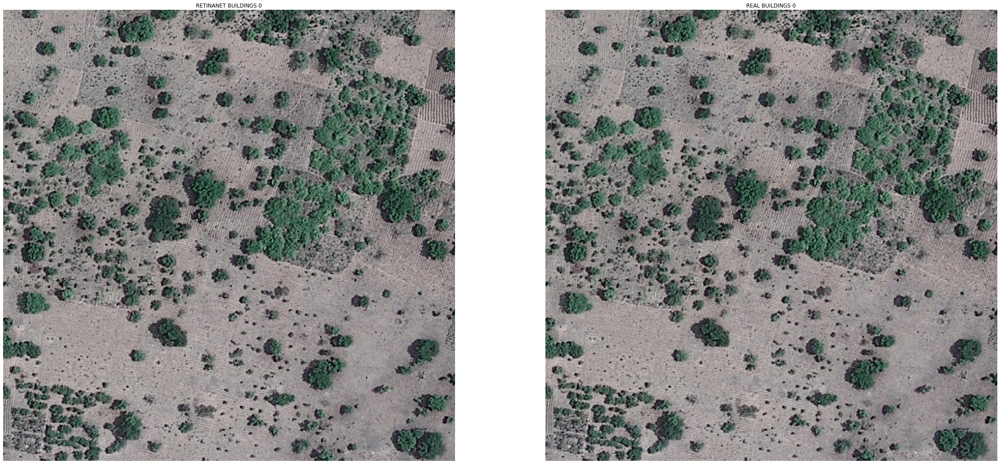

In [ ]:
for im in poc_imgs:
  print('Running inference on: ' + im)
  im_path=poc_dir+im
  d,boxes = img_inference2(im_path,0.2)
  f, ax = plt.subplots(1,2,figsize=(40, 20))
  image = cv2.cvtColor(cv2.imread(im_path), cv2.COLOR_BGR2RGB)[0:1000,500:1500,:]

  
  plt.axis('off')
  ax[0].imshow(d)
  ax[1].imshow(image)
  ax[0].axis('off')
  ax[1].axis('off')

  real_b = df_test_data[df_test_data[0]==im].shape[0]

  ax[0].set_title('RETINANET BUILDINGS {}'.format(len(boxes)))
  ax[1].set_title('REAL BUILDINGS {}'.format(real_b))

  
  plt.show()